# Install dependencies


In [1]:
import torch
from torch import nn
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import torchvision
import torchvision.datasets as datasets
from torchvision import transforms
from matplotlib import pyplot as plt
import numpy as np

# Hyperparameters

In [19]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
lr = 0.0002
noise_dim = 64
batch_size = 128
num_epochs = 10

# Create Discriminator
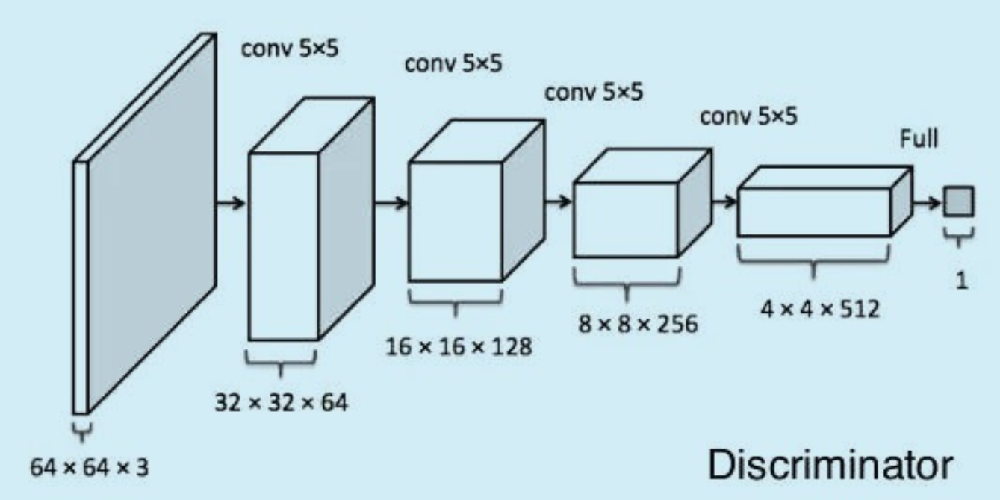

In [3]:
class Discriminator(nn.Module):
  def __init__(self, channels_img, features_disc):
    super(Discriminator, self).__init__()

    self.disc = nn.Sequential(
      # Input Image --> 64x64
      nn.Conv2d(channels_img, features_disc, kernel_size=4, stride=2, padding=1), # 32x32
      nn.LeakyReLU(0.2),
      self.conv_block_disc(features_disc, features_disc*2, 4, 2, 1),    # 16x16
      self.conv_block_disc(features_disc*2, features_disc*4, 4, 2, 1),  # 8x8
      self.conv_block_disc(features_disc*4, features_disc*8, 4, 2, 1),  # 4x4
      nn.Conv2d(features_disc*8, 1, 4, 2, 0),                           # 1x1
      nn.Sigmoid(),
    )

  def conv_block_disc(self, in_features, out_features, kernel_size, stride, padding):
    return nn.Sequential(
        nn.Conv2d(
            in_channels=in_features,
            out_channels=out_features,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
            bias=False,
        ),
        nn.BatchNorm2d(out_features),
        nn.LeakyReLU(0.2),
    )

  def forward(self, x):
    return self.disc(x)



# Create Generator
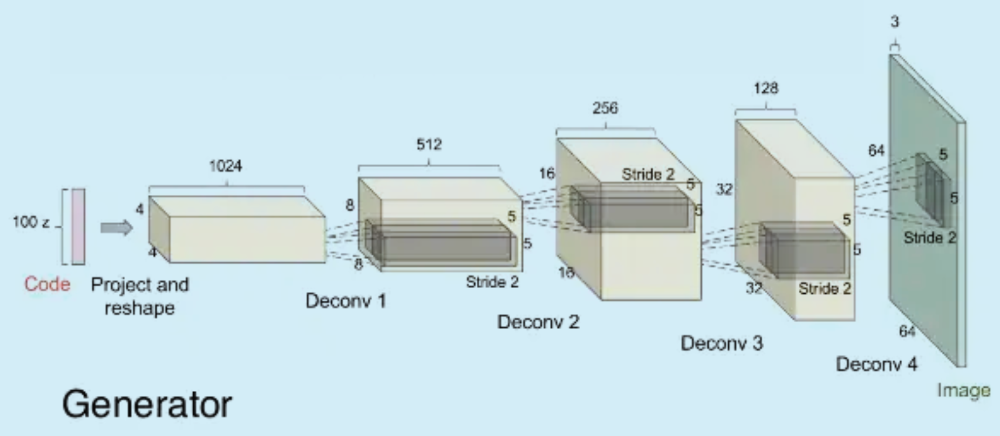

In [4]:
class Generator(nn.Module):
  def __init__(self, noise_dim, channels_img, features_gen):
    super(Generator, self).__init__()

    self.gen = nn.Sequential(
        self.conv_block_gen(noise_dim, features_gen*8, 4, 1, 0),                # 64*16 = 1024
        self.conv_block_gen(features_gen*8, features_gen*4, 4, 2, 1),           # 64*8 = 512
        self.conv_block_gen(features_gen*4, features_gen*2, 4, 2, 1),           # 64*4 = 256
        self.conv_block_gen(features_gen*2, features_gen, 4, 2, 1),             # 64*2 = 128
        nn.ConvTranspose2d(features_gen, channels_img, 4, 2, 1, bias=False),    # 64*1 = 64
        nn.Tanh(),
    )

    # print(self.gen)

  def conv_block_gen(self, in_features, out_features, kernel_size, stride, padding):
    return nn.Sequential(
        nn.ConvTranspose2d(
            in_channels=in_features,
            out_channels=out_features,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
            bias=False,
        ),
        nn.BatchNorm2d(out_features),
        nn.ReLU(),
        )

  def forward(self, x):
    return self.gen(x)

In [5]:
def init_weights(model):
  for m in model.modules():
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
      nn.init.normal_(m.weight.data, 0.0, 0.02)


# Check everything is alright

In [6]:
def test():
  N, in_channels, H, W = 8, 3, 64, 64
  noise_dim = 100
  x = torch.randn((N, in_channels, H, W))
  disc = Discriminator(in_channels, 8)
  init_weights(disc)

  # print(disc(x).shape)
  assert disc(x).shape == (N, 1, 1, 1)

  gen = Generator(noise_dim, in_channels, 64)
  z = torch.randn((N, noise_dim, 1, 1))

  # print(gen(z).shape)
  assert gen(z).shape == (((N, in_channels, H, W)))

  print("Sucsses")

test()

Sucsses


# Creation Fixed Noise & Normalize Pixels

In [7]:
features_dis = 64
features_gen = 64
channels_num = 1
image_size = 64

disc = Discriminator(channels_num, features_dis).to(device)
gen = Generator(noise_dim, channels_num, features_gen).to(device)

fixed_noise = torch.randn((batch_size, noise_dim, 1, 1)).to(device)

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5))]
)

# Handle Dataset

In [8]:
dataset = datasets.MNIST(root='dataset/', transform=transform, download=True)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

100%|██████████| 9.91M/9.91M [00:02<00:00, 4.90MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 133kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.26MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 12.2MB/s]


# Optimizer & Loss Function

In [9]:
opt_disc = torch.optim.Adam(disc.parameters(), lr=lr, betas=(0.5, 0.999))
opt_gen = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999))
criterion = nn.BCELoss()

writer_fake = SummaryWriter(f"runs/GAN_MNIST/fake")
writer_real = SummaryWriter(f"runs/GAN_MNIST/real")
step = 0

In [23]:
from os import write
for epoch in range(num_epochs):
  for batch_id, (real, _) in enumerate(loader):
    real = real.to(device)
    noise = torch.randn((batch_size, noise_dim, 1, 1)).to(device) # Ensure noise is 4D
    fake = gen(noise)

    ### Train Discriminator
    disc_real = disc(real).reshape(-1)
    lossD_real = criterion(disc_real, torch.ones_like(disc_real))

    disc_fake = disc(fake.detach()).view(-1)
    lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))

    lossD = (lossD_real + lossD_fake) / 2

    disc.zero_grad()
    lossD.backward(retain_graph=True)
    opt_disc.step()

    ### Train Generator
    output = disc(fake).view(-1)
    lossG = criterion(output, torch.ones_like(output))
    gen.zero_grad()
    lossG.backward()
    opt_gen.step()

    if batch_id == 0:
      print(f"Epoch [{epoch+1}/{num_epochs}] Batch {batch_id}/{len(loader)} \
            Loss D: {lossD:.4f}, loss G: {lossG:.4f}")

      with torch.no_grad():
        fake = gen(fixed_noise).reshape(-1, 1, image_size, image_size)
        data = real.reshape(-1, 1, image_size, image_size)
        img_grid_fake = torchvision.utils.make_grid(fake, normalize=True)
        img_grid_real = torchvision.utils.make_grid(data, normalize=True)

        writer_fake.add_image("Fake", img_grid_fake, global_step=step)
        writer_real.add_image("Real", img_grid_real, global_step=step)

        step += 1

Epoch [1/10] Batch 0/469             Loss D: 0.0167, loss G: 4.6769
Epoch [2/10] Batch 0/469             Loss D: 0.0254, loss G: 4.6149
Epoch [3/10] Batch 0/469             Loss D: 0.0157, loss G: 4.9967
Epoch [4/10] Batch 0/469             Loss D: 0.4113, loss G: 8.8448
Epoch [5/10] Batch 0/469             Loss D: 0.4486, loss G: 2.0315
Epoch [6/10] Batch 0/469             Loss D: 1.2640, loss G: 15.0231
Epoch [7/10] Batch 0/469             Loss D: 0.0353, loss G: 4.5753
Epoch [8/10] Batch 0/469             Loss D: 0.0027, loss G: 6.1426
Epoch [9/10] Batch 0/469             Loss D: 0.0185, loss G: 4.4059
Epoch [10/10] Batch 0/469             Loss D: 0.0037, loss G: 6.6894


In [16]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [25]:
%tensorboard --logdir=runs/GAN_MNIST

Reusing TensorBoard on port 6006 (pid 13205), started 0:24:07 ago. (Use '!kill 13205' to kill it.)

<IPython.core.display.Javascript object>